**What is the Viterbi Algorithm?**
The Viterbi algorithm is a dynamic programming algorithm that
allows us to compute the most probable path or the most likely sequence of hidden states that results in a sequnce of observed events.

The Viterbi Algorithm is a more efficint method of solving similar problems that can be solved using a Hidden Markov Model. Hidden Markov Models are used to compute the most likely sequence of unobservable states that result in the observed state we see. The unobservable states are called hidden states.

In a Hidden Markov Model there are transition probabilities which are the probabilities of a hidden state based on another hidden state. Each hidden state then has an affect on the observed state and the probabilitty of observing an observed state given a hidden state is called the emission probability.

Credit: https://www.cis.upenn.edu/~cis2620/notes/Example-Viterbi-DNA.pdf

https://medium.com/analytics-vidhya/viterbi-algorithm-for-prediction-with-hmm-part-3-of-the-hmm-series-6466ce2f5dc6#:~:text=The%20Viterbi%20algorithm%20is%20an,time%20step%20to%20the%20next.

Website explaining the Viterbi algorithm with example numbers.

**Quick Aside About Dynamic Programming**

Dynamic programming is an optimization over recursion. Given a recursive solution that has repeated calls for same inputs. The inputs can be optimized using Dynamic Programming.

The idea is to store the results of subproblems, so that we do not have to re-compute the subproblems.

For example, if we write simple recursive solution for Fibonacci Numbers, we get exponential time complexity and if we optimize it by storing solutions of subproblems, time complexity reduces to linear.

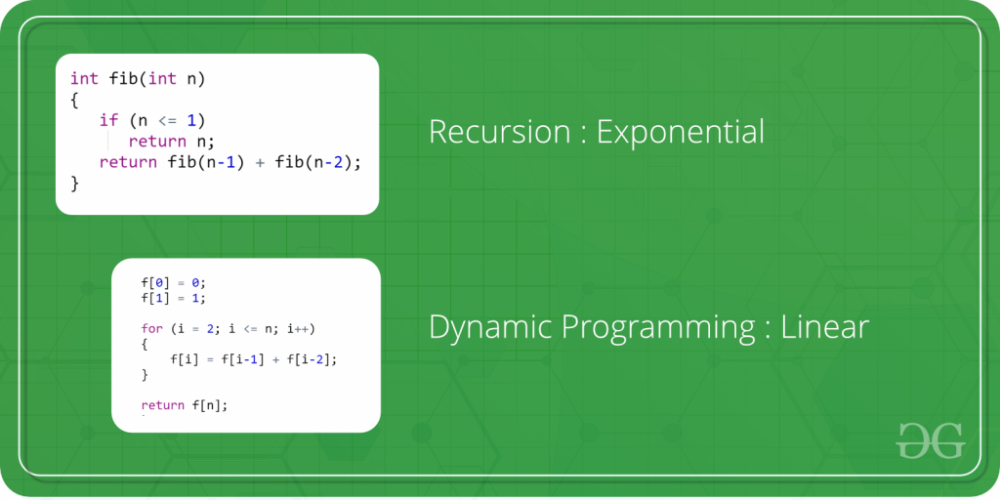

Credit: https://www.geeksforgeeks.org/dynamic-programming/

**Hidden Markov Model**

Example of HMM:
Let's say you are taking a class in university. Everyday your proffessor only has two moods. She is either happy or sad. You know thw transitions between your proffessor being sad or happy and you know the mood an any given day depends only on the mood of the previous day.

The graph below represents the transition probabilities of your proffessor being happy or sad.


1.   From 'S' the very first day there is a 40% chance your proffessor is happy and a 60% chance your proffessor is sad.
2.   If the proffessor is happy yesterday then there is a 70% chance she is happy today. And a 30% chance she is sad today.
3.   If the proffessor is sad yesterday then there is a 50% chance she will be sad today and a 50% chance she will be happy today.

The Hidden Markov Model starts to form with the Emission Probability.

**The story continues.**

Your proffessor wears either a red, green, or blue shirt every day of the course. The color of her shirt is directly linked to her mood on that day. The emission probabilities below can be interpreted as follows...

1.   If she is happy then there is an 80% chance she will wear a red shirt, a 10% chance that she will wear a green shirt, and a 10% chance she will wear a blue shirt.
2.   If she is sad then there is a 20% chance she will wear a red shirt, a 30% chance she will wear a green shirt, and a 50% chance she will wear a blue shirt.


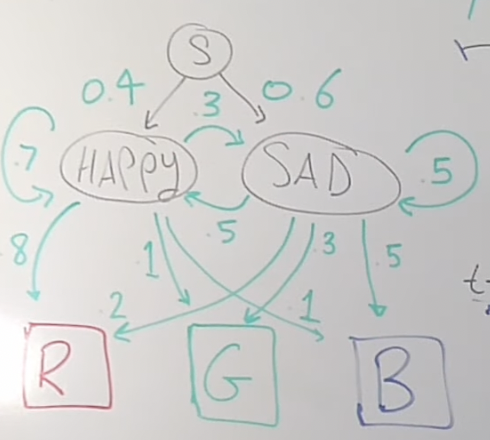

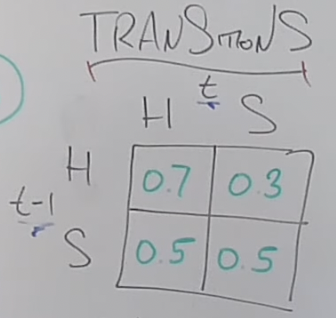

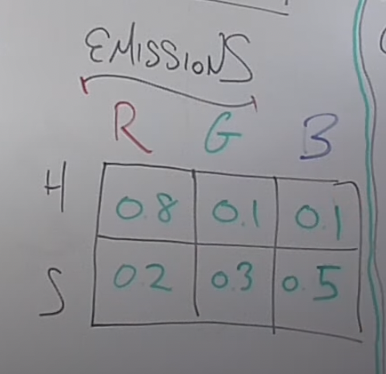

The transition probability corresponds directly to what is called the hidden states. We as a student can only observe the color of our proffessor's shirt. We do not know if the proffessor is happy or sad. That means the state of our proffessor being happy or sad is hidden.

However, the color of our professor is observable and is part of the observed states.

The basic idea of a Hidden Markov Models is there are some hidden states that we do not know about. Those hidden states directly affect the observed states.

**The story continues again.**

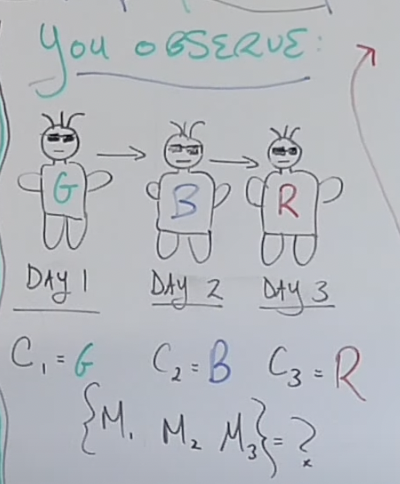

We are three days into the course and you observed that on the first day your proffessor wore a green shirt, on the second day a blue shirt, on the third day a red shirt. The question we want to ask ourselves is what are the most likely moods of the proffessor on these three days?

**To solve this question**

The way to answer this is to maximize the probability of the given color sequence along with her moods for each day. That maximization is the most likely sequence of moods for the given sequnce of shirt colors.

That probability can be written in conditional form and then simplified. Then find the combinations of probabilities that result in the highest probability and that is your answer to what the most likely moods of the professor was on each day.

Credit: https://www.youtube.com/watch?v=fX5bYmnHqqE&t=705s

**Viterbi Algorithm**

The Hidden Markov Model should seem brute force. Inefficient is another word. The Viterbi algorithm is what solves the Hidden Markov Model's straightforwardness and makes that process more efficient.

The way we are going to understand the Viterbi Algortihm is by applying the algorithm to speech tagging. Speech tagging is for every word observed, we are trying to answer what part of speech is the word?

Lets look at, "The fans watch the race", in this sentence the parts of speech can be the following respectively determiner, verb or noun, verb or noun, determiner, verb or noun. The image below should help clarify the problem and the probabilities.

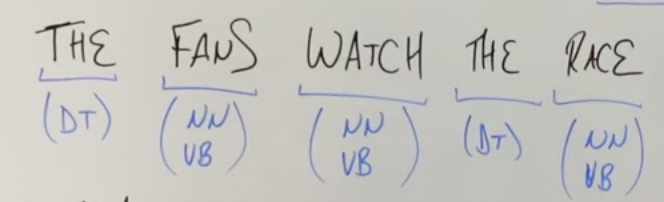

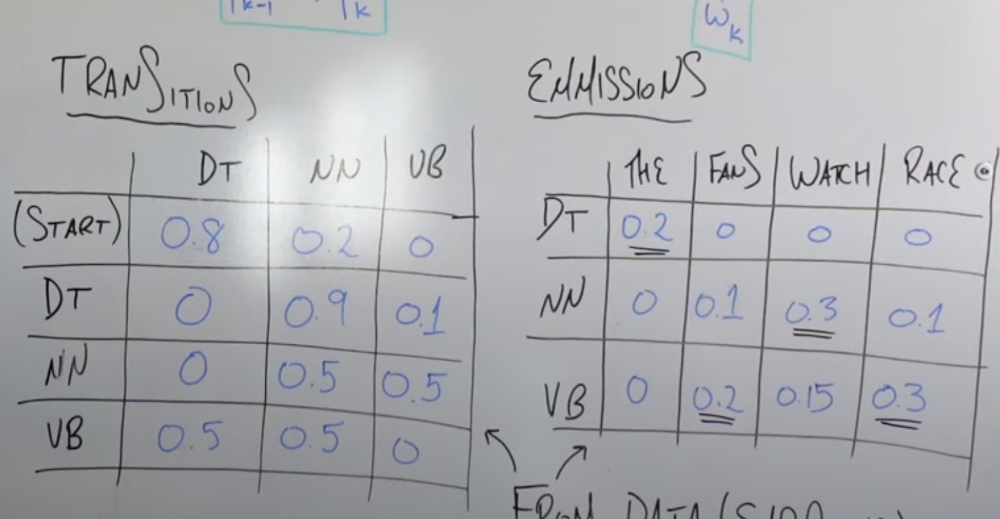

Set up as an HMM problem you have hidden parts of speech, P1 through P5, and those hidden states have transition probabilities from one to the next and those parts of speech generate the observed state which is the sentence itself.

The goal is to decide which parts of speech is the most likely combination to form this sentence.

To answer this with HMM we would try to maximize the probability of both the emission probabilities and the transition probabilities. We would accomplish this by iterating over all possible combinations until we found a max.

To answer this with the Viterbi algorithm...

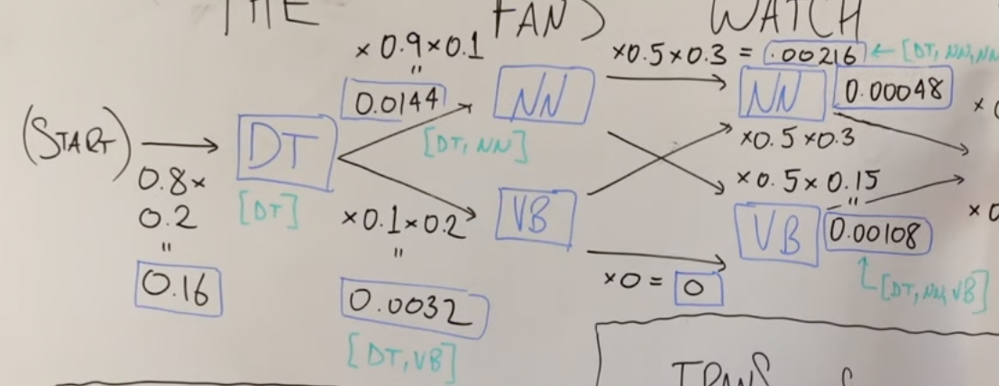

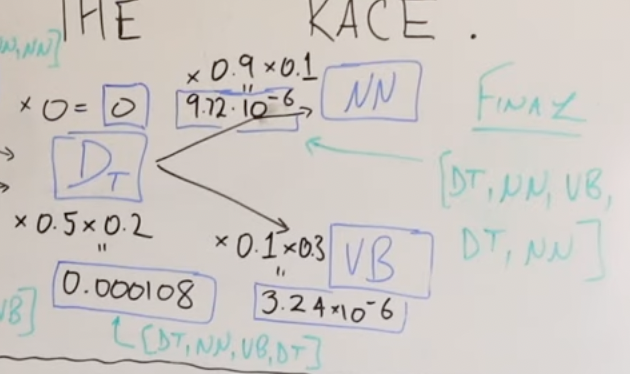

The key difference between brute force HMM and Viterbi Algorithm is there a places where you can cut off branches of possibilities with the Viterbi Algorithm. Those being where you have multiple paths into one node, you onlt keep the branch of the node with the highest probability to get to that node.

That is the advantage of the Viterbi Algorithm. This crucial difference results in an efficiency difference and is why someone would choose the Viterbi algorithm to solve this problem.

The HMM brute force methods a Big O complexity of O(P^L), that is, P possibilities of length L. At each step L you have P possibilities, which is, P x P x P...P all the way to L. Hence, P^L.

With Viterbi, at each first layer we have P possibilities but we only keep one of those P possibilities, so at each layer we have P options and P parts of speech. So, for each word we have P^2 operations and there are L words. So, Viterbi has a O(L*P^2).

Credit: https://www.youtube.com/watch?v=IqXdjdOgXPM&t=17s



**Example of Viterbi Algorithm**

Consider a village where all villagers are either healthy or have a fever, and only the village doctor can determine whether each has a fever. The doctor diagnoses fever by asking patients how they feel. The villagers may only answer that they feel normal, dizzy, or cold.

The doctor believes that the health condition of the patients operates as a discrete Markov chain. There are two states, "Healthy" and "Fever", but the doctor cannot observe them directly; they are hidden from the doctor. On each day, there is a certain chance that a patient will tell the doctor "I feel normal", "I feel cold", or "I feel dizzy", depending on the patient's health condition.

In [ ]:
obs = ("normal", "cold", "dizzy")
states = ("Healthy", "Fever")
start_p = {"Healthy": 0.6, "Fever": 0.4}
trans_p = {
    "Healthy": {"Healthy": 0.7, "Fever": 0.3},
    "Fever": {"Healthy": 0.4, "Fever": 0.6},
}
emit_p = {
    "Healthy": {"normal": 0.5, "cold": 0.4, "dizzy": 0.1},
    "Fever": {"normal": 0.1, "cold": 0.3, "dizzy": 0.6},
}

* 'start_p' represents the doctor's belief about which state the HMM is in when the patient first visits
* 'transition_p' represents the change of the health condition in the underlying Markov chain. In this example, a patient who is healthy today has only a 30% chance of having a fever tomorrow.
* 'emit_p' represents how likely each possible observation (normal, cold, or dizzy) is, given the underlying condition (healthy or fever). A patient who is healthy has a 50% chance of feeling normal; one who has a fever has a 60% chance of feeling dizzy.

**Graphical Representation of HMM Above**
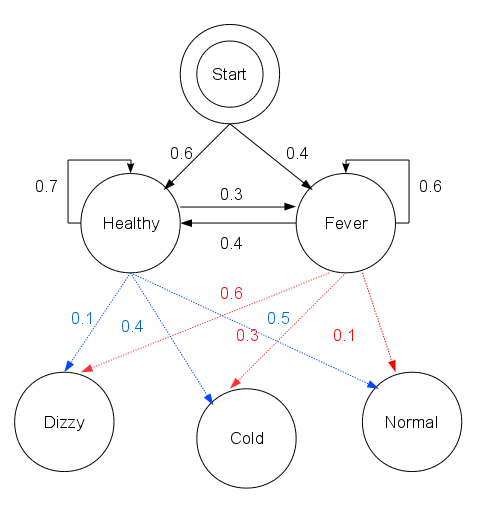

**Ultimate Question to be Answered**

A patient visits three days in a row, and the doctor discovers that the patient feels normal on the first day, cold on the second day, and dizzy on the third day.

The doctor has a question: what is the most likely sequence of health conditions of the patient that would explain these observations? This can be answered by the Viterbi algorithm.

**Code Implementation**

In [ ]:
def viterbi(obs, states, start_p, trans_p, emit_p):
    V = [{}]

    # For each state st, it calculates the probability of being in state st at time t=0 and stores it in the matrix V.
    for st in states:
        V[0] [st] = {"prob": start_p[st] * emit_p[st] [obs[0]], "prev": None}

    # Iterates over time steps t and hidden states st, calculating the probability of the most likely path to state st at time t.
    # The results are stored in the matrix V.
    for t in range(1, len(obs)):
        V.append({})
        for st in states:
            max_tr_prob = V[t - 1] [states[0]] ["prob"] * trans_p[states[0]] [st] * emit_p[st] [obs[t]]
            prev_st_selected = states[0]
            for prev_st in states[1:]:
                tr_prob = V[t - 1] [prev_st] ["prob"] * trans_p[prev_st] [st] * emit_p[st] [obs[t]]
                if tr_prob > max_tr_prob:
                    max_tr_prob = tr_prob
                    prev_st_selected = prev_st

            max_prob = max_tr_prob
            V[t] [st] = {"prob": max_prob, "prev": prev_st_selected}

    for line in dptable(V):
        print(line)

    opt = []
    max_prob = 0.0
    best_st = None

    # Get most probable state and its backtrack
    for st, data in V[-1].items():
        if data["prob"] > max_prob:
            max_prob = data["prob"]
            best_st = st
    opt.append(best_st)
    previous = best_st

    # Follow the backtrack till the first observation
    for t in range(len(V) - 2, -1, -1):
        opt.insert(0, V[t + 1] [previous] ["prev"])
        previous = V[t + 1] [previous] ["prev"]

    print ("The steps of states are " + " ".join(opt) + " with highest probability of %s" % max_prob)

def dptable(V):
    # Print a table of steps from dictionary
    yield " " * 5 + "     ".join(("%3d" % i) for i in range(len(V)))
    for state in V[0]:
        yield "%.7s: " % state + " ".join("%.7s" % ("%lf" % v[state] ["prob"]) for v in V)

**Explanation of Code**

The function viterbi takes the following arguments:
* obs is the sequence of observations,['normal', 'cold', 'dizzy']
* states is the set of hidden states, ['healthy', 'fever']
* start_p is the start probability
* trans_p are the transition probabilities
* emit_p are the emission probabilities.

'V' is a list that will store Viterbi values. It starts with an empty dictionary in the list to store the values at time step 0.

Then for each 'st' in the 'states' list the algorithm computes the initial Viterbi value for that state at time step 0.

This value is calculated as the product of the initial state probability and the emission probability for the first observation. ((start_p[st]) * (emit_p[st][obs[0]])).

Then we run the Viterbi algorithm for the remaining time steps.

Inside the loop for the time steps the algorithm appends an empty dictionary to the 'V' list for the current time step.

For each state 'st' at time step 't' the algorithm calculates the maximum transition probability from the previous time step. 'max_tr_prob' is initialized with the first state in the 'states' list. It then iterates over the other states and updates 'max_tr_prob' if a higher transition probability is found.

Then we get to the dptable function who's main goal is to print a table of the Viterbi values. It prints a header with the time step indices then prints the probabilities that correlate with each time step.

The last thing the code is going to do is print the most likely sequence of states and its associated maximum probability.

In [ ]:
viterbi(obs,states,start_p,trans_p,emit_p)

       0       1       2
Healthy: 0.30000 0.08400 0.00588
Fever: 0.04000 0.02700 0.01512
The steps of states are Healthy Healthy Fever with highest probability of 0.01512


This output reveals that the observed states on each day normal, cold, dizzy were most likely generated by the patient being healthy on the first day, healthy on the second day, and fever on the third day.

Using the method of solving the parts of speech problem before is how we can arrive at the highest probability of 0.01512.

Credit: https://en.wikipedia.org/wiki/Viterbi_algorithm

**Transition Probabilities**

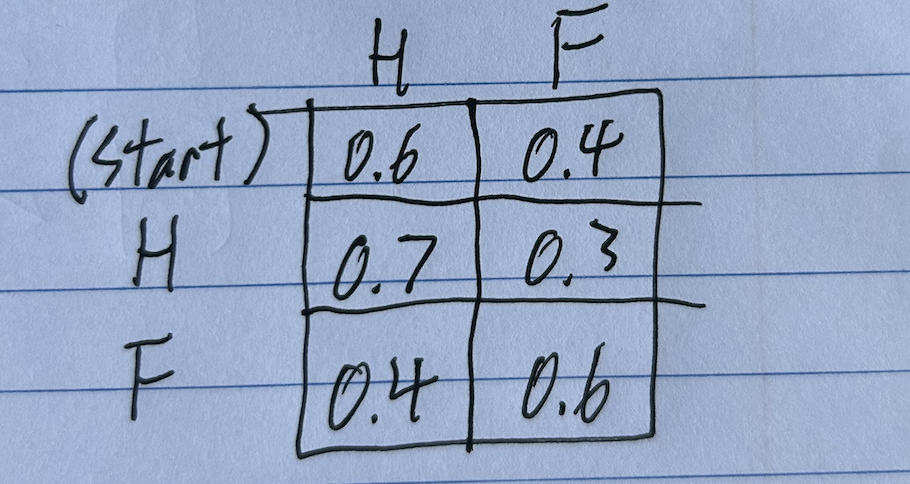

**Emission Probabilities**

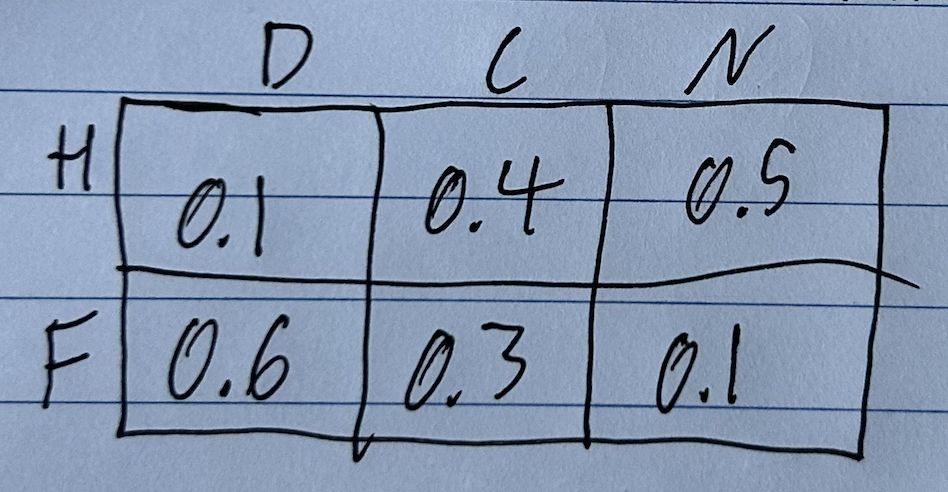

**Solving using Viterbi**

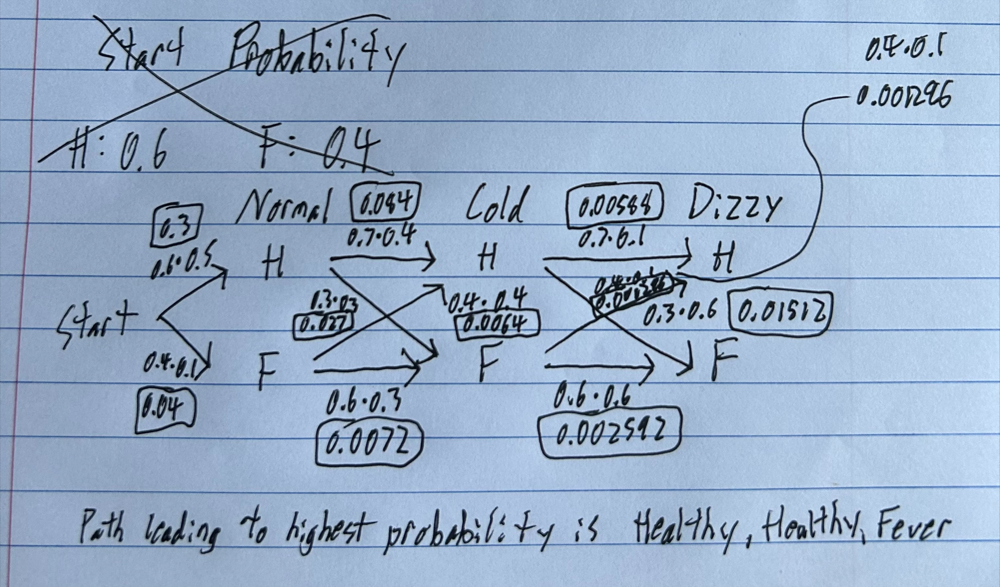

**Off-the-Shelf Implementation**

In [ ]:
pip install hmmlearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.4/160.4 kB 3.9 MB/s eta 0:00:00


In [ ]:
import numpy as np
from hmmlearn.hmm import CategoricalHMM

obs = ("normal", "cold", "dizzy")
states = ("Healthy", "Fever")
start_p = {"Healthy": 0.6, "Fever": 0.4}
trans_p = {
    "Healthy": {"Healthy": 0.7, "Fever": 0.3},
    "Fever": {"Healthy": 0.4, "Fever": 0.6},
}
emit_p = {
    "Healthy": {"normal": 0.5, "cold": 0.4, "dizzy": 0.1},
    "Fever": {"normal": 0.1, "cold": 0.3, "dizzy": 0.6},
}


model = CategoricalHMM(n_components = 2,algorithm="viterbi")
model.get_params()
model.startprob = start_p
model.transmat = trans_p
model.emissionprob = emit_p

gen_obs = np.random.choice([0,1,2],size = (10000,3))

train = gen_obs[:int(len(gen_obs)*0.75)]
test = gen_obs[:int(len(gen_obs)*0.25)]

model.fit(train)

states = model.predict(np.array([[0,1,2]]))

print("Most likely states: \n", states)
print("Transmission matrix: \n", model.transmat_)
print("Emissions matrix: \n", model.emissionprob_)

Most likely states: 
 [0 1 0]
Transmission matrix: 
 [[0.25474947 0.74525053]
 [0.9740977  0.0259023 ]]
Emissions matrix: 
 [[0.28359153 0.31146475 0.40494373]
 [0.39496853 0.36560982 0.23942164]]


The implementation of the Viterbi Algorithm from hmmlearn does perform worse than the implementaion prior. Above you can see the transmission matrix and the emission matrix the algorithm generated to calculate the most likely sequence. These matrices are much different than the original matrices defined above. Additionally, the model is not good at producing the correct state of sequences that is observed. The observed sequence being "normal","cold","dizzy" (0,1,2).

The poor performance could be due improper setup and training of the model.

Credit: https://hmmlearn.readthedocs.io/en/latest/auto_examples/plot_casino.html

**When is Viterbi Bad**

1. Arithmetic underflow and overflow. Essentially, the numbers the algorithm is computing become too small or too large and will be represented as either zero or infinity. This leads too inaccurate results. The solution to this issue is working the log of probabilities.

2. Given that HMM can be used for language processing if the given observations contains an unkown word then all possible branches that contain that word will have a probability of zero.

3. Another situation where the Viterbi algorithm would not be ideal is when you can observe the states you are trying to find using the Viterbi algorithm. In that case it would be inefficent to not directly observe the states you are trying to find.

4. The Viterbi algorithm more truthfully the Hidden Markov Model also makes large assumptions about transition and emission probabilites. That being, a given hidden state is directly affected by a previous hidden states and those hidden states also have a direct affect on the observed states. This can be a weakness to the model.

5. An extenstion of point 4 is the Viterbi algorithm would not work well with data where you do not know any probabilites. Without known probabilities it is not feasible to use a Hidden Markov Model and therefore the Viterbi algorithm.

Credit: https://eliteai.medium.com/addressing-viterbi-algorithm-challenges-29739f1b881f